In [1]:
import pandas as pd
import numpy as np # linear algebra
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns; sns.set() # graphing data
%matplotlib inline

import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

In [2]:
df = pd.read_csv('C:/Users/Elioc/Desktop/Work/Code/MachineLearningwCS/Project/austinHousingData.csv')

In [3]:
df.shape

(15171, 47)

# Basic Info

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15171 entries, 0 to 15170
Data columns (total 47 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   zpid                        15171 non-null  int64  
 1   city                        15171 non-null  object 
 2   streetAddress               15171 non-null  object 
 3   zipcode                     15171 non-null  int64  
 4   description                 15171 non-null  object 
 5   latitude                    15171 non-null  float64
 6   longitude                   15171 non-null  float64
 7   propertyTaxRate             15171 non-null  float64
 8   garageSpaces                15171 non-null  int64  
 9   hasAssociation              15171 non-null  bool   
 10  hasCooling                  15171 non-null  bool   
 11  hasGarage                   15171 non-null  bool   
 12  hasHeating                  15171 non-null  bool   
 13  hasSpa                      151

In [5]:
df.head()

,zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,...,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage
0,111373431,pflugerville,14424 Lake Victor Dr,78660,"14424 Lake Victor Dr, Pflugerville, TX 78660 i...",30.430632,-97.663078,1.98,2,True,...,1,1,1.266667,2.666667,1063,14,3.0,4,2,111373431_ffce26843283d3365c11d81b8e6bdc6f-p_f...
1,120900430,pflugerville,1104 Strickling Dr,78660,Absolutely GORGEOUS 4 Bedroom home with 2 full...,30.432673,-97.661697,1.98,2,True,...,1,1,1.400000,2.666667,1063,14,2.0,4,1,120900430_8255c127be8dcf0a1a18b7563d987088-p_f...
2,2084491383,pflugerville,1408 Fort Dessau Rd,78660,Under construction - estimated completion in A...,30.409748,-97.639771,1.98,0,True,...,1,1,1.200000,3.000000,1108,14,2.0,3,1,2084491383_a2ad649e1a7a098111dcea084a11c855-p_...
3,120901374,pflugerville,1025 Strickling Dr,78660,Absolutely darling one story home in charming ...,30.432112,-97.661659,1.98,2,True,...,1,1,1.400000,2.666667,1063,14,2.0,3,1,120901374_b469367a619da85b1f5ceb69b675d88e-p_f...
4,60134862,pflugerville,15005 Donna Jane Loop,78660,Brimming with appeal & warm livability! Sleek ...,30.437368,-97.656860,1.98,0,True,...,1,1,1.133333,4.000000,1223,14,3.0,3,2,60134862_b1a48a3df3f111e005bb913873e98ce2-p_f.jpg


In [6]:
df.describe()

,zpid,zipcode,latitude,longitude,propertyTaxRate,garageSpaces,parkingSpaces,yearBuilt,latestPrice,numPriceChanges,...,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories
count,1.517100e+04,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,1.517100e+04,15171.000000,...,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000
mean,1.044193e+08,78735.932964,30.291596,-97.778532,1.994085,1.229187,1.224507,1988.554743,5.127677e+05,3.032892,...,0.049173,1.035990,0.976798,1.838495,5.779912,1237.304660,14.857228,2.683010,3.440380,1.467273
std,3.179426e+08,18.893475,0.096973,0.084715,0.053102,1.352117,1.352732,21.579458,4.531853e+05,2.487392,...,0.234937,0.263633,0.292043,1.068376,1.860276,326.513311,1.741857,1.054445,0.849942,0.523697
min,2.858495e+07,78617.000000,30.085030,-98.022057,1.980000,0.000000,0.000000,1905.000000,5.500000e+03,1.000000,...,0.000000,0.000000,0.000000,0.200000,2.333333,396.000000,10.000000,0.000000,0.000000,1.000000
25%,2.941115e+07,78727.000000,30.203313,-97.838009,1.980000,0.000000,0.000000,1974.000000,3.090000e+05,1.000000,...,0.000000,1.000000,1.000000,1.100000,4.000000,966.000000,14.000000,2.000000,3.000000,1.000000
50%,2.949441e+07,78739.000000,30.284416,-97.769539,1.980000,1.000000,1.000000,1993.000000,4.050000e+05,2.000000,...,0.000000,1.000000,1.000000,1.566667,5.778694,1287.000000,15.000000,3.000000,3.000000,1.000000
75%,7.033762e+07,78749.000000,30.366585,-97.717903,1.980000,2.000000,2.000000,2006.000000,5.750000e+05,4.000000,...,0.000000,1.000000,1.000000,2.266667,7.000000,1496.000000,16.000000,3.000000,4.000000,2.000000
max,2.146313e+09,78759.000000,30.517323,-97.569504,2.210000,22.000000,22.000000,2020.000000,1.350000e+07,23.000000,...,2.000000,3.000000,2.000000,9.000000,9.500000,1913.000000,19.000000,27.000000,20.000000,4.000000


# Some feature are redundant, drop them.

In [7]:
drop_columns = ['description','numOfPhotos','MedianStudentsPerTeacher','homeImage','zpid','streetAddress','latestPriceSource']
#drop_cols2 = ['numOfAccessibilityFeatures','numOfParkingFeatures','numOfPatioAndPorchFeatures','numOfSecurityFeatures']
#drop_cols3 = ['numOfWaterfrontFeatures','numOfWindowFeatures','numOfCommunityFeatures','numOfPrimarySchools']
#drop_cols4 = ['numOfElementarySchools','numOfMiddleSchools','numOfHighSchools','avgSchoolDistance','avgSchoolRating']
drop_cols5 = ['avgSchoolSize','city','latest_saledate']

df.drop(drop_columns, axis=1, inplace=True)
#df.drop(drop_cols2, axis=1, inplace=True)
#df.drop(drop_cols3, axis=1, inplace=True)
#df.drop(drop_cols4, axis=1, inplace=True)
df.drop(drop_cols5, axis=1, inplace=True)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15171 entries, 0 to 15170
Data columns (total 37 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   zipcode                     15171 non-null  int64  
 1   latitude                    15171 non-null  float64
 2   longitude                   15171 non-null  float64
 3   propertyTaxRate             15171 non-null  float64
 4   garageSpaces                15171 non-null  int64  
 5   hasAssociation              15171 non-null  bool   
 6   hasCooling                  15171 non-null  bool   
 7   hasGarage                   15171 non-null  bool   
 8   hasHeating                  15171 non-null  bool   
 9   hasSpa                      15171 non-null  bool   
 10  hasView                     15171 non-null  bool   
 11  homeType                    15171 non-null  object 
 12  parkingSpaces               15171 non-null  int64  
 13  yearBuilt                   151

In [9]:
df.head()

,zipcode,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,...,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,numOfBathrooms,numOfBedrooms,numOfStories
0,78660,30.430632,-97.663078,1.98,2,True,True,True,True,False,...,2601.0,1,0,1,1,1.266667,2.666667,3.0,4,2
1,78660,30.432673,-97.661697,1.98,2,True,True,True,True,False,...,1768.0,1,0,1,1,1.400000,2.666667,2.0,4,1
2,78660,30.409748,-97.639771,1.98,0,True,True,False,True,False,...,1478.0,0,2,1,1,1.200000,3.000000,2.0,3,1
3,78660,30.432112,-97.661659,1.98,2,True,True,True,True,False,...,1678.0,1,0,1,1,1.400000,2.666667,2.0,3,1
4,78660,30.437368,-97.656860,1.98,0,True,True,False,True,False,...,2132.0,1,0,1,1,1.133333,4.000000,3.0,3,2


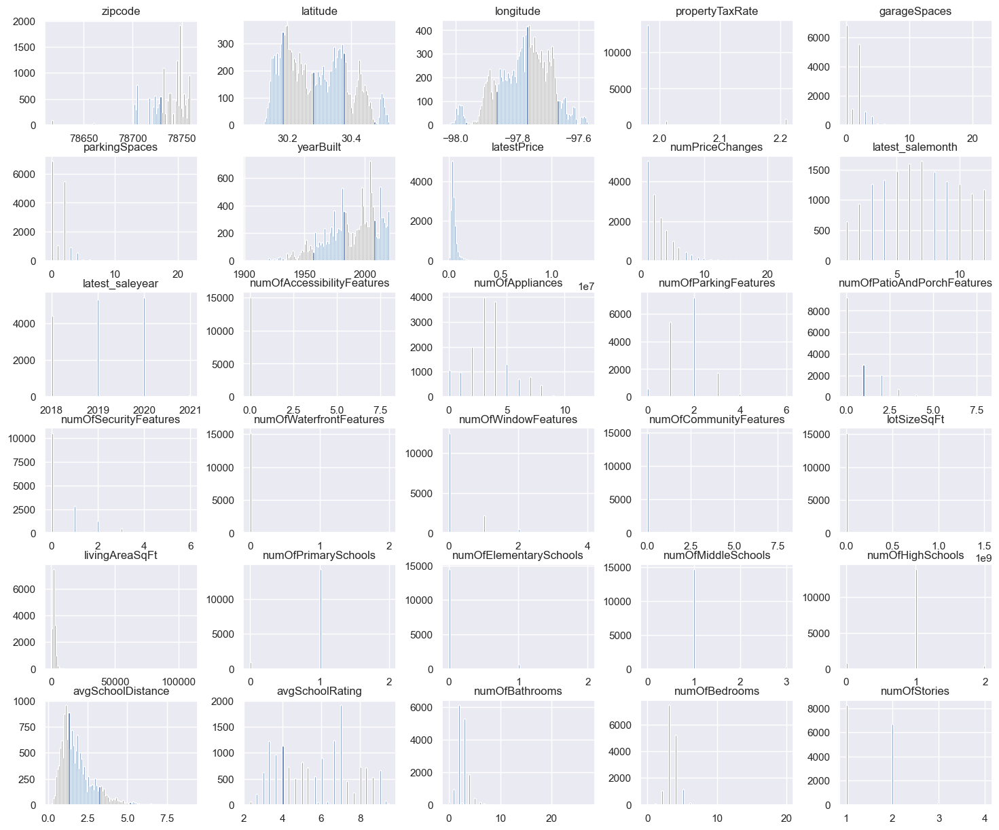

In [10]:
# check how our histograms are looking
df.hist(figsize=(18,15), bins=100);

# Plot the locations of all House in Austin, colored by type

In [11]:
map = px.scatter(df, x="longitude", y="latitude", color="zipcode", template="plotly_dark",color_continuous_scale=px.colors.qualitative.Vivid_r, title="House type in Austin", width=600,height=400)
map.show()

# Preproccess | Skip for first Regression

In [13]:
from sklearn import preprocessing

# Preproccess homeType | zipcode | yearbuilt to int val
le = preprocessing.LabelEncoder()
# Encode labels in column 'species'. 
df['homeType']= le.fit_transform(df['homeType']) 
df['zipcode']= le.fit_transform(df['zipcode']) 
df['yearBuilt']= le.fit_transform(df['yearBuilt']) 
df['propertyTaxRate'] = le.fit_transform(df['propertyTaxRate'])

# Hot encoding
df = pd.get_dummies(df, columns=['latest_saleyear', 'latest_salemonth'])

# Regression for Price Prediction
## Linear regression to base price on features: sqft, # bedrooms...

In [201]:
# We use sklearn.metrics and import the modules for evluation
from sklearn.metrics import mean_squared_error, mean_absolute_error

# However, one thing that we should keep in mind is that Sckit learn do not offer RMSLE(Root Mean Suqared Log Error)
# Therefore, we have to manually define RMSLE as below
def rmsle(y, pred):
    log_y = np.log1p(y)
    log_pred = np.log1p(pred)
    squared_error = (log_y - log_pred) ** 2
    rmsle = np.sqrt(np.mean(squared_error))
    return rmsle

In [202]:
# RMSE
def rmse(y,pred):
    return np.sqrt(mean_squared_error(y,pred))

In [203]:
# MSE, RMSE, RMSLE 
def evaluate_regr(y,pred):
    rmsle_val = rmsle(y,pred)
    rmse_val = rmse(y,pred)
    
    # MAE equation already exists in sklearn modules
    mae_val = mean_absolute_error(y,pred)
    print('RMSLE: {0:.3f}, RMSE: {1:.3F}, MAE: {2:.3F}'.format(rmsle_val, rmse_val, mae_val))

# Modelling 1

In [204]:
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.linear_model import LinearRegression , Ridge , Lasso
from sklearn import preprocessing

# Preproccess homeType | zipcode | yearbuilt to int val
le = preprocessing.LabelEncoder()
# Encode labels in column 'species'. 
df['homeType']= le.fit_transform(df['homeType']) 
df['zipcode']= le.fit_transform(df['zipcode']) 
df['yearBuilt']= le.fit_transform(df['yearBuilt']) 
df['propertyTaxRate'] = le.fit_transform(df['propertyTaxRate'])

y_target = df['latestPrice']
X_features = df.drop(['latestPrice'],axis=1,inplace=False)

X_train, X_test, y_train, y_test = train_test_split(X_features, y_target, test_size=0.3, random_state=0)

lr_reg = LinearRegression()
lr_reg.fit(X_train, y_train)
pred = lr_reg.predict(X_test)

evaluate_regr(y_test ,pred)

RMSLE: 0.507, RMSE: 398621.094, MAE: 171170.408


In [205]:
df['latestPrice'].describe()

count    1.517100e+04
mean     5.127677e+05
std      4.531853e+05
min      5.500000e+03
25%      3.090000e+05
50%      4.050000e+05
75%      5.750000e+05
max      1.350000e+07
Name: latestPrice, dtype: float64

In [206]:
def get_top_error_data(y_test, pred, n_tops = 5):
    # Using Featuers in DataFrame and comparing them with one another
    result_df = pd.DataFrame(y_test.values, columns=['real_count'])
    result_df['predicted_count']= np.round(pred)
    result_df['diff'] = np.abs(result_df['real_count'] - result_df['predicted_count'])
    # Pulling out them in orders
    print(result_df.sort_values('diff', ascending=False)[:n_tops])
    
get_top_error_data(y_test,pred,n_tops=5)

      real_count  predicted_count        diff
909   13000000.0         778495.0  12221505.0
954   12720000.0         835278.0  11884722.0
2624   8750000.0        1736481.0   7013519.0
3708   8750000.0        1962562.0   6787438.0
3862   4745000.0        1599691.0   3145309.0


## Price is left-biased

<Axes: >

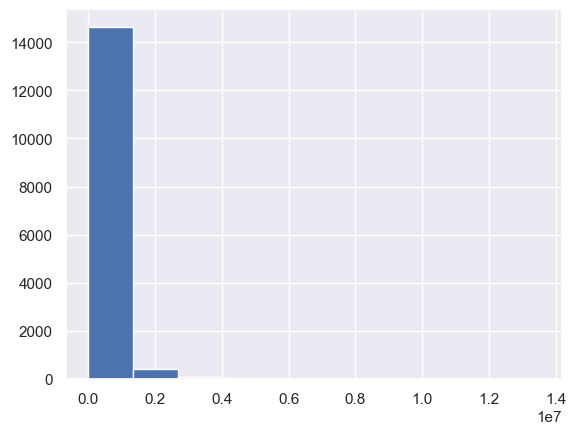

In [207]:
y_target.hist()

## Take log on dependent variables

<Axes: >

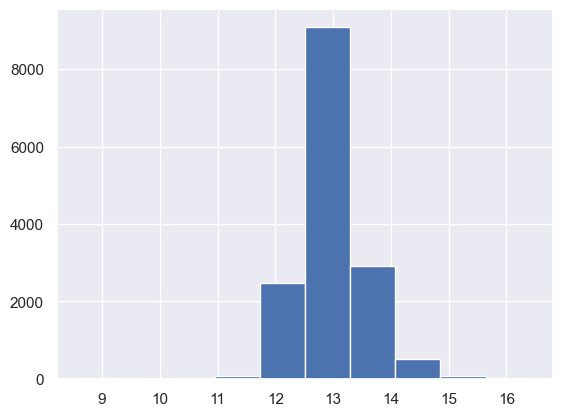

In [208]:
y_log_transform = np.log1p(y_target)
y_log_transform.hist()

## Re train

In [209]:
y_target_log = np.log1p(y_target)

X_train, X_test, y_train, y_test = train_test_split(X_features, y_target_log, test_size=0.3, random_state=0)
lr_reg = LinearRegression()
lr_reg.fit(X_train, y_train)
pred = lr_reg.predict(X_test)

y_test_exp = np.expm1(y_test)

pred_exp = np.expm1(pred)

evaluate_regr(y_test_exp ,pred_exp)

RMSLE: 0.375, RMSE: 403960.167, MAE: 148939.005


# Model Validation 1

<Axes: >

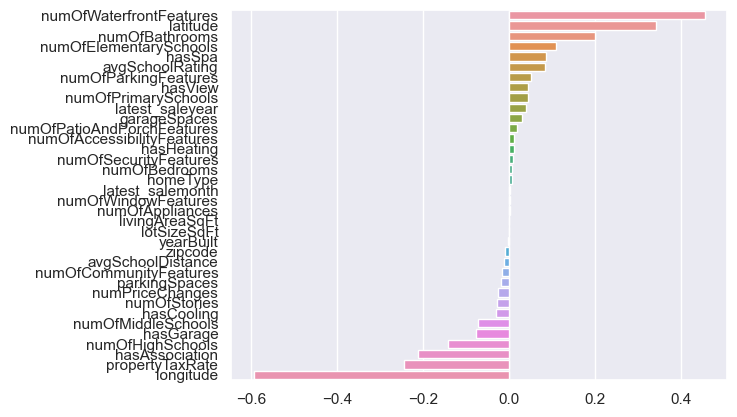

In [210]:
coef = pd.Series(lr_reg.coef_, index=X_features.columns)
coef_sort = coef.sort_values(ascending=False)
sns.barplot(x=coef_sort.values, y=coef_sort.index)

## One hot encoding

In [211]:
X_features_ohe = pd.get_dummies(X_features, columns=['latest_saleyear', 'latest_salemonth'])

## Retrain

In [212]:
X_train, X_test, y_train, y_test = train_test_split(X_features_ohe, y_target_log,
                                                    test_size=0.3, random_state=0)

# Error Score
def get_model_predict(model, X_train, X_test, y_train, y_test, is_expm1=False):
    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    if is_expm1 :
        y_test = np.expm1(y_test)
        pred = np.expm1(pred)
    print('###',model.__class__.__name__,'###')
    evaluate_regr(y_test, pred)
# end of function get_model_predict    

# model Evluation
lr_reg = LinearRegression()
ridge_reg = Ridge(alpha=10)
lasso_reg = Lasso(alpha=0.01)

for model in [lr_reg, ridge_reg, lasso_reg]:
    get_model_predict(model,X_train, X_test, y_train, y_test,is_expm1=True)

### LinearRegression ###
RMSLE: 0.375, RMSE: 403634.083, MAE: 148938.101
### Ridge ###
RMSLE: 0.374, RMSE: 403008.292, MAE: 148570.820
### Lasso ###
RMSLE: 0.382, RMSE: 411560.075, MAE: 151768.823


## Retain

<Axes: >

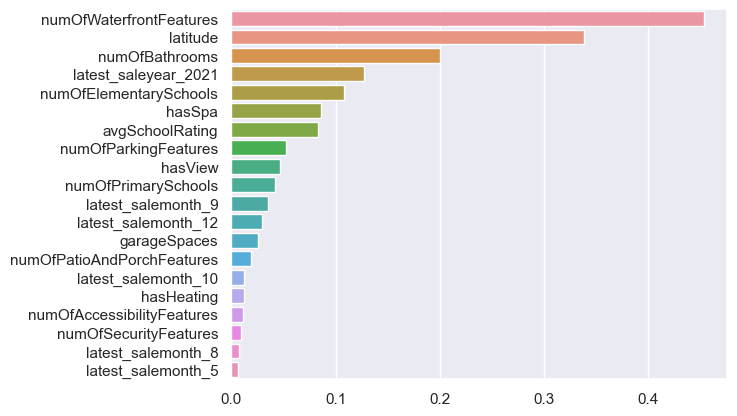

In [213]:
coef = pd.Series(lr_reg.coef_ , index=X_features_ohe.columns)
coef_sort = coef.sort_values(ascending=False)[:20]
sns.barplot(x=coef_sort.values , y=coef_sort.index)

# Bonus, Decision Tree regression

In [214]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import sys
#!{sys.executable} -m pip install xgboost
from xgboost import XGBRegressor
#!{sys.executable} -m pip install lightgbm
from lightgbm import LGBMRegressor

# RandomForest, GBM, XGBoost, LightGBM model 
rf_reg = RandomForestRegressor(n_estimators=500)
gbm_reg = GradientBoostingRegressor(n_estimators=500)
xgb_reg = XGBRegressor(n_estimators=500)
lgbm_reg = LGBMRegressor(n_estimators=500)

for model in [rf_reg, gbm_reg, xgb_reg, lgbm_reg]:
    # XGBoost may troubleshoot if your input is DataFrame so assign them in ndarray
    get_model_predict(model,X_train.values, X_test.values, y_train.values, y_test.values,is_expm1=True)

### RandomForestRegressor ###
RMSLE: 0.285, RMSE: 345936.940, MAE: 96536.815
### GradientBoostingRegressor ###
RMSLE: 0.281, RMSE: 341208.425, MAE: 95285.367
### XGBRegressor ###
RMSLE: 0.295, RMSE: 347827.640, MAE: 101088.168
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1635
[LightGBM] [Info] Number of data points in the train set: 10619, number of used features: 50
[LightGBM] [Info] Start training from score 12.969828
### LGBMRegressor ###
RMSLE: 0.280, RMSE: 334051.923, MAE: 94355.528


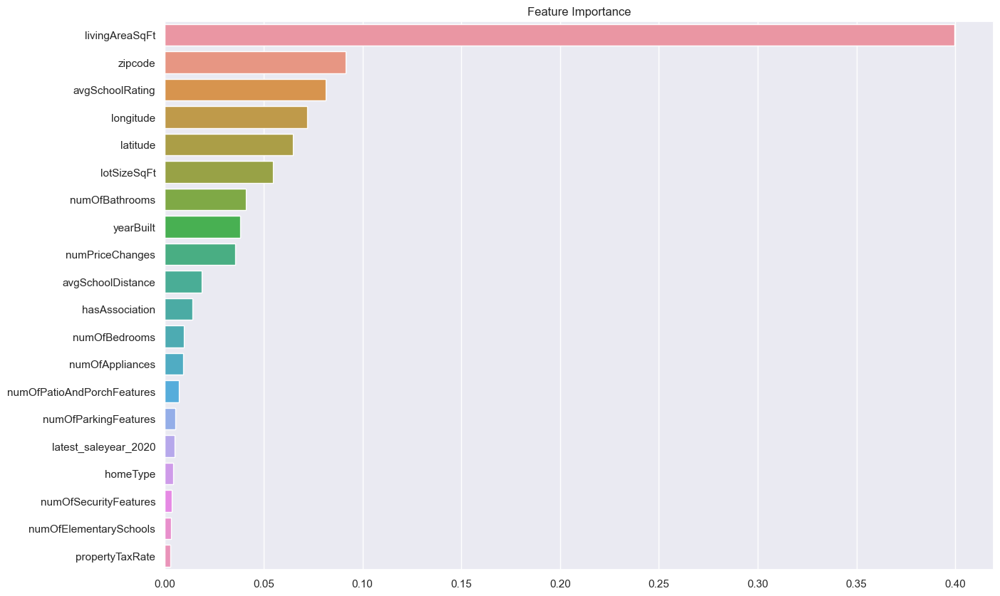

In [215]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#from matplotlib import font_manager, rc
#font_path = "C:/Windows/Fonts/NanumBarunGothic.TTF"
#font = font_manager.FontProperties(fname=font_path).get_name()
#rc('font', family=font)

ftr_importances_values = rf_reg.feature_importances_
ftr_importances = pd.Series(ftr_importances_values,index=X_train.columns  )
ftr_top20 = ftr_importances.sort_values(ascending=False)[:20]

plt.figure(figsize=(15,10))
plt.title('Feature Importance')
sns.barplot(x=ftr_top20 , y = ftr_top20.index)
sns.set(font_scale=1.1)
plt.show()

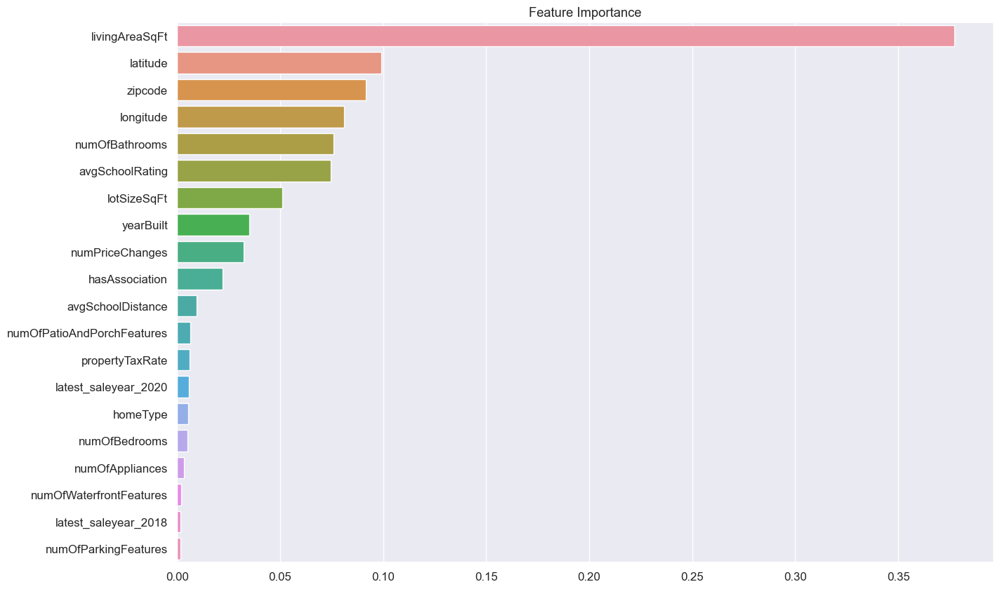

In [216]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#from matplotlib import font_manager, rc
#font_path = "C:/Windows/Fonts/NanumBarunGothic.TTF"
#font = font_manager.FontProperties(fname=font_path).get_name()
#rc('font', family=font)

ftr_importances_values = gbm_reg.feature_importances_
ftr_importances = pd.Series(ftr_importances_values,index=X_train.columns  )
ftr_top20 = ftr_importances.sort_values(ascending=False)[:20]

plt.figure(figsize=(15,10))
plt.title('Feature Importance')
sns.barplot(x=ftr_top20 , y = ftr_top20.index)
sns.set(font_scale=1.1)
plt.show()

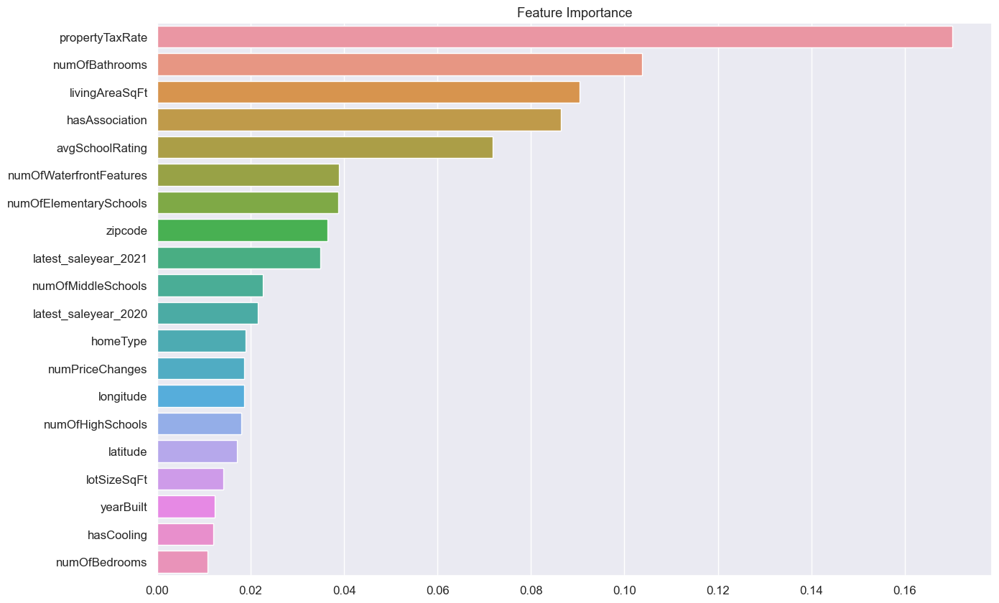

In [217]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#from matplotlib import font_manager, rc
#font_path = "C:/Windows/Fonts/NanumBarunGothic.TTF"
#font = font_manager.FontProperties(fname=font_path).get_name()
#rc('font', family=font)

ftr_importances_values = xgb_reg.feature_importances_
ftr_importances = pd.Series(ftr_importances_values,index=X_train.columns  )
ftr_top20 = ftr_importances.sort_values(ascending=False)[:20]

plt.figure(figsize=(15,10))
plt.title('Feature Importance')
sns.barplot(x=ftr_top20 , y = ftr_top20.index)
sns.set(font_scale=1.1)
plt.show()

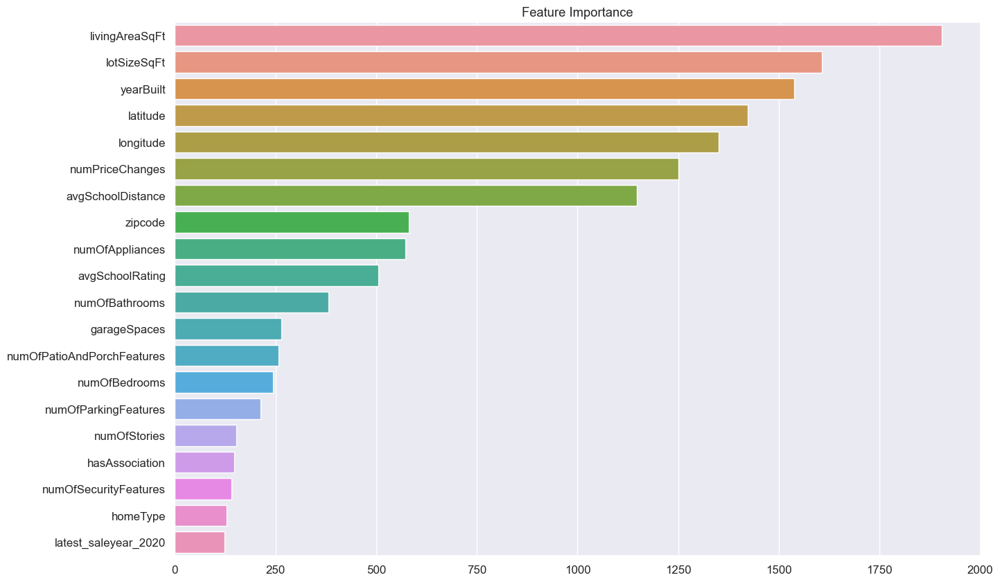

In [218]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#from matplotlib import font_manager, rc
#font_path = "C:/Windows/Fonts/NanumBarunGothic.TTF"
#font = font_manager.FontProperties(fname=font_path).get_name()
#rc('font', family=font)

ftr_importances_values = lgbm_reg.feature_importances_
ftr_importances = pd.Series(ftr_importances_values,index=X_train.columns  )
ftr_top20 = ftr_importances.sort_values(ascending=False)[:20]

plt.figure(figsize=(15,10))
plt.title('Feature Importance')
sns.barplot(x=ftr_top20 , y = ftr_top20.index)
sns.set(font_scale=1.1)
plt.show()


# Classification

## Correlation

<Axes: >

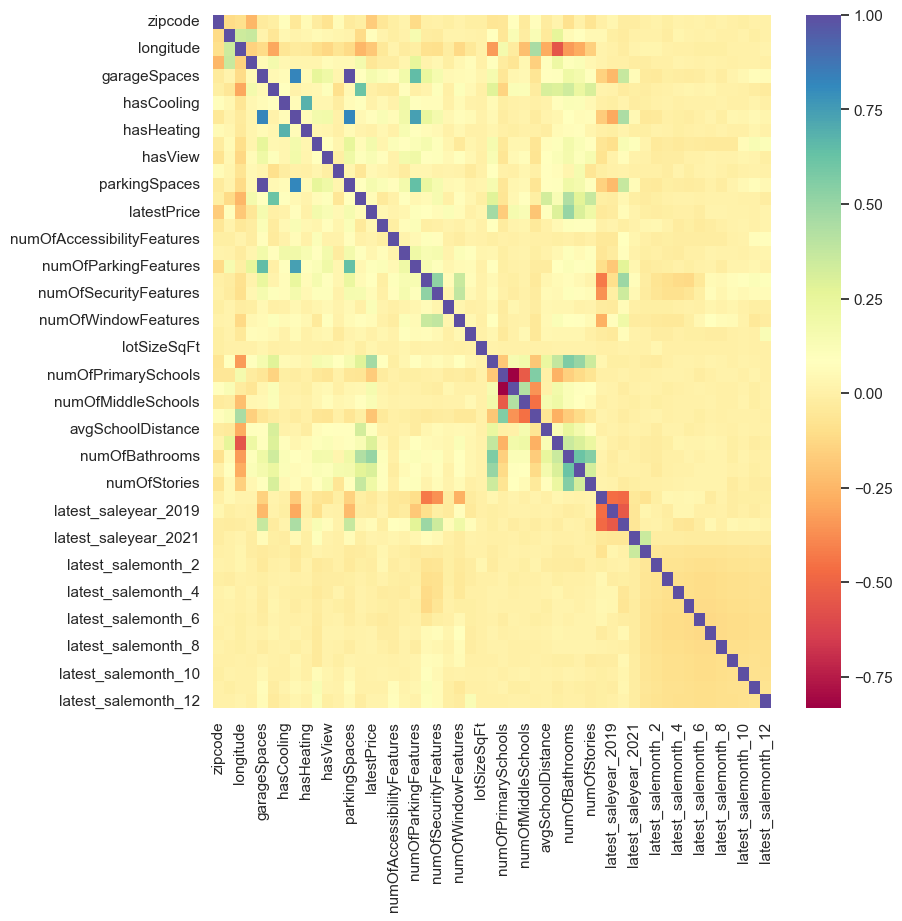

In [16]:
import seaborn as sns

plt.figure(figsize=(9, 9))
corr = df.corr()
sns.heatmap(corr, cmap='Spectral')

In [17]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
import warnings
warnings.filterwarnings('ignore')

# Create DecisionTree Classifier
dt_clf = DecisionTreeClassifier(random_state=156)

y_target = df['homeType']
X_features = df.drop(['homeType'],axis=1,inplace=False)

X_train , X_test , y_train , y_test = train_test_split(X_features, y_target,
                                                       test_size=0.2,  random_state=11)

# DecisionTreeClassifer,
dt_clf.fit(X_train , y_train)

DecisionTreeClassifier(random_state=156)

In [18]:
from sklearn.metrics import accuracy_score, classification_report

# Step 6: Evaluate the Model
y_pred = dt_clf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

# Additional evaluation metrics
print(classification_report(y_test, y_pred))

Accuracy: 0.942339373970346
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         7
           1       0.47      0.49      0.48        96
           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         4
           4       0.25      0.29      0.27        14
           5       0.00      0.00      0.00         2
           6       1.00      0.67      0.80         6
           7       0.98      0.97      0.97      2856
           8       0.43      0.54      0.48        37
           9       0.78      0.58      0.67        12

    accuracy                           0.94      3035
   macro avg       0.39      0.35      0.37      3035
weighted avg       0.94      0.94      0.94      3035



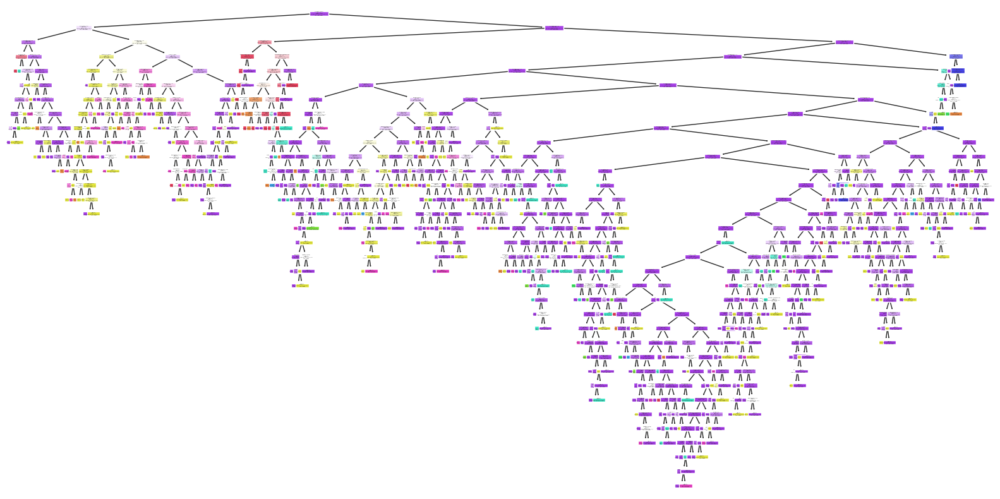

In [145]:
import matplotlib.pyplot as plt

# Step 6: Visualize the Decision Tree
plt.figure(figsize=(20, 10))
plot_tree(dt_clf, filled=True, feature_names=X_features.columns.tolist(), class_names=dt_clf.classes_.tolist())
plt.show()

In [139]:
from sklearn.tree import export_graphviz

# Create tree.dot file from out_file, which is created by export_graphviz()

export_graphviz(dt_clf, out_file="tree.dot", class_names=dt_clf.classes_.tolist() , \
feature_names = X_features.columns.tolist(), impurity=True, filled=True)

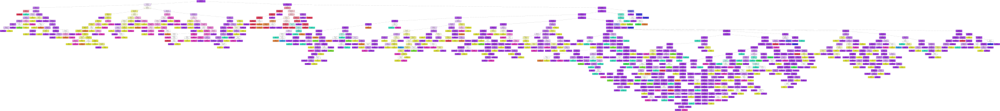

In [1]:
#!{sys.executable} -m pip install graphviz
import graphviz

with open("tree.dot") as f:
    dot_graph = f.read()
graphviz.Source(dot_graph)

# Clustering

In [167]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# feature selection
selectedFeatures = ['latitude','longitude','latestPrice']
X = df[selectedFeatures]

In [208]:
# Determine k
k=5

In [209]:
# Apply K-Means Clustering
kmeans = KMeans(n_clusters=k, random_state=42)
df['cluster'] = kmeans.fit_predict(X)

# Step 5: Analyze Cluster Results
cluster_centers = kmeans.cluster_centers_
for i, center in enumerate(cluster_centers):
    print(f'Cluster {i + 1} Center: {center}')

Cluster 1 Center: [ 3.02851147e+01 -9.77653964e+01  3.41044197e+05]
Cluster 2 Center: [ 3.03065728e+01 -9.78077330e+01  6.79926082e+05]
Cluster 3 Center: [ 3.03002376e+01 -9.78010260e+01  1.42929402e+06]
Cluster 4 Center: [ 3.03416228e+01 -9.78133414e+01  1.06454286e+07]
Cluster 5 Center: [ 3.03095063e+01 -9.78231094e+01  3.12730741e+06]


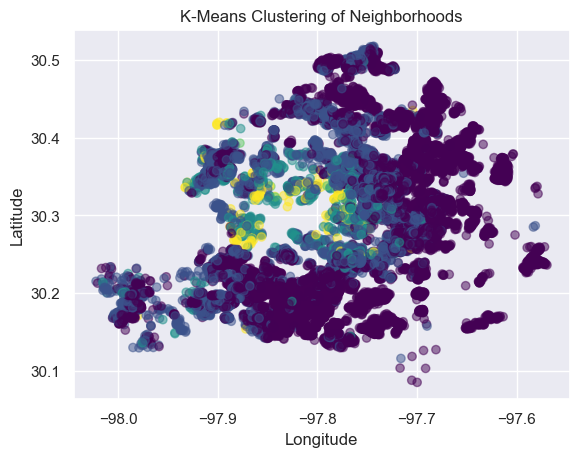

In [210]:
# Step 6: Visualize the Results
# For 2D visualization (lat, lon)
plt.scatter(df['longitude'], df['latitude'], c=df['cluster'], cmap='viridis', alpha=0.5)
plt.title('K-Means Clustering of Neighborhoods')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

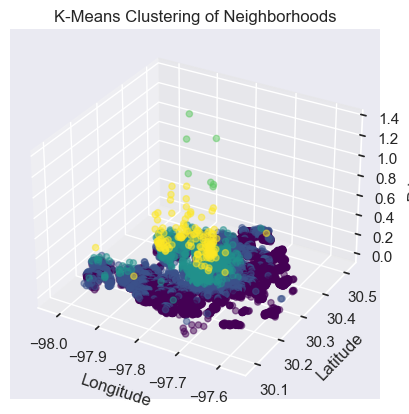

In [211]:
# For 3D visualization (lat, lon, price)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df['longitude'], df['latitude'], df['latestPrice'], c=df['cluster'], cmap='viridis', alpha=0.5)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Price')
plt.title('K-Means Clustering of Neighborhoods')
plt.show()

# Clustering 2

In [32]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# feature selection
X = df

In [89]:
# Determine k
k=9

In [90]:
# Apply K-Means Clustering
kmeans = KMeans(n_clusters=k, random_state=42)
df['cluster'] = kmeans.fit_predict(X)

# Step 5: Analyze Cluster Results
cluster_centers = kmeans.cluster_centers_
for i, center in enumerate(cluster_centers):
    print(f'Cluster {i + 1} Center: {center}')

Cluster 1 Center: [ 2.80657670e+01  3.02958283e+01 -9.77991844e+01  2.02767339e-01
  1.27844209e+00  5.62008883e-01  9.84284250e-01  5.75333106e-01
  9.92483772e-01  7.56747523e-02  2.31978135e-01  6.80696959e+00
  1.27143833e+00  8.15707209e+01  4.69779458e+05  2.89904339e+00
  1.33242228e-02  3.46412709e+00  1.73573625e+00  7.55722583e-01
  5.26477622e-01  1.36658695e-03  2.38469423e-01  2.64776221e-02
  1.28102085e+04  2.24332918e+03  9.45848992e-01  3.05773830e-02
  1.03553126e+00  9.43457465e-01  1.81368452e+00  6.28897015e+00
  2.64403826e+00  3.48599248e+00  1.46481039e+00  2.64776221e-01
  3.29859925e-01  3.99555859e-01  5.80799453e-03  3.84352579e-02
  5.68841818e-02  8.04578066e-02  8.66074479e-02  9.42944995e-02
  1.10864366e-01  1.09326956e-01  9.41236761e-02  8.59241544e-02
  8.89989751e-02  7.20874616e-02  8.19952169e-02  8.52425692e+00]
Cluster 2 Center: [ 7.00000000e+00  3.03143158e+01 -9.77680435e+01  0.00000000e+00
  5.00000000e+00  0.00000000e+00  1.00000000e+00  1.0

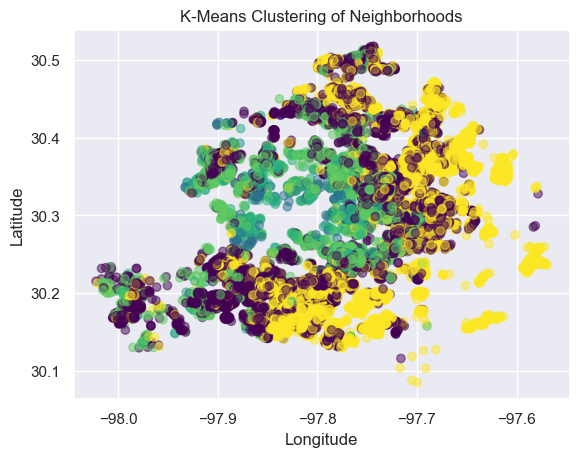

In [91]:
# Step 6: Visualize the Results
# For 2D visualization (lat, lon)
plt.scatter(df['longitude'], df['latitude'], c=df['cluster'], cmap='viridis', alpha=0.5)
plt.title('K-Means Clustering of Neighborhoods')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

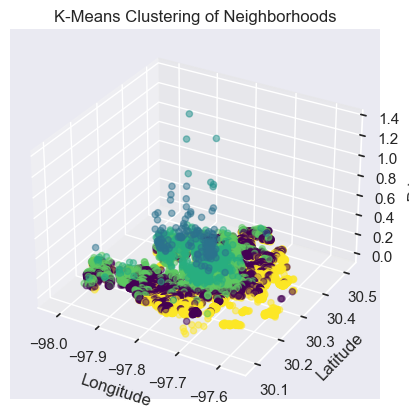

In [92]:
# For 3D visualization (lat, lon, price)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df['longitude'], df['latitude'], df['latestPrice'], c=df['cluster'], cmap='viridis', alpha=0.5)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Price')
plt.title('K-Means Clustering of Neighborhoods')
plt.show()

# Dimensionality Reduction with PCA

In [170]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns


y = df['latestPrice']
X = df.drop(['latestPrice'],axis=1,inplace=False)

## Part 1

In [184]:
# Step 1: Standardize or normalize the data
X_std = StandardScaler().fit_transform(X)

pca = PCA(2)  # project from 64 to 2 dimensions
projected = pca.fit_transform(X_std)
print(X.shape)
print(projected.shape)

(15171, 50)
(15171, 2)


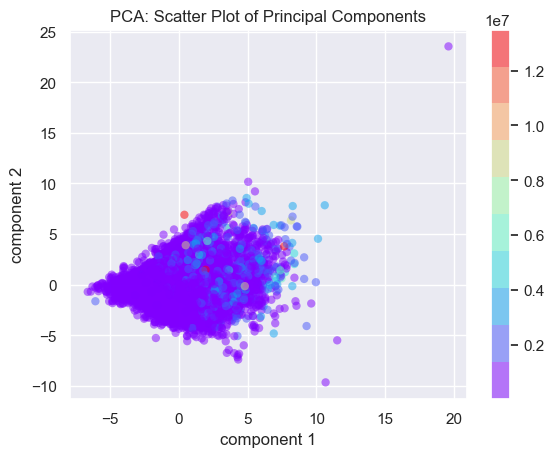

In [185]:
plt.scatter(projected[:, 0], projected[:, 1],
            c=y, edgecolor='none', alpha=0.5,
            cmap=plt.cm.get_cmap('rainbow', 10))
plt.title('PCA: Scatter Plot of Principal Components')
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.colorbar();

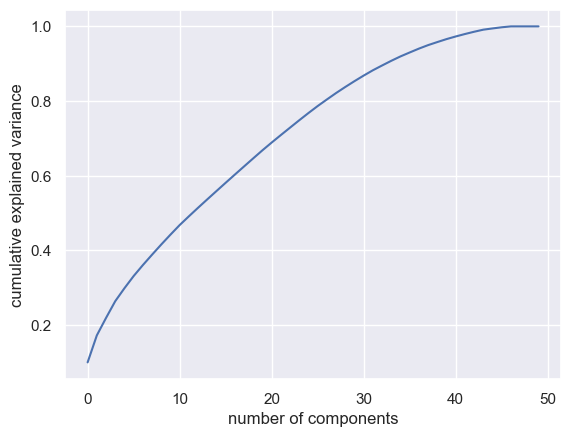

In [187]:
pca = PCA().fit(X_std)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

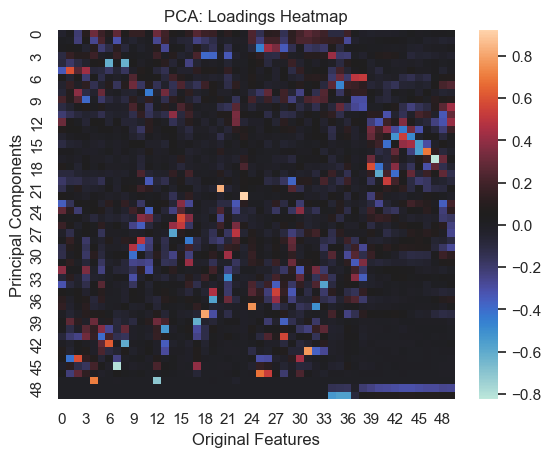

In [188]:
loadings = pca.components_
sns.heatmap(loadings,cmap="icefire")
plt.title('PCA: Loadings Heatmap')
plt.xlabel('Original Features')
plt.ylabel('Principal Components')
plt.show()

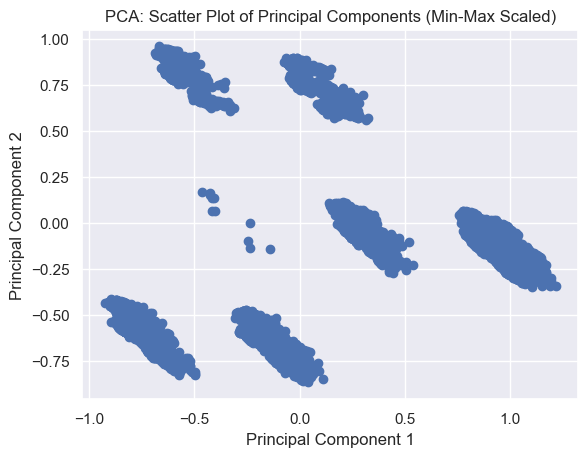

In [190]:
from sklearn.preprocessing import MinMaxScaler

# Use Min-Max scaling instead of StandardScaler
X_minmax = MinMaxScaler().fit_transform(X)

# Create a PCA instance
pca_minmax = PCA()

# Fit and transform the data using Min-Max scaled features
X_pca_minmax = pca_minmax.fit_transform(X_minmax)

# Scatter plot of the first two principal components
plt.scatter(X_pca_minmax[:, 0], X_pca_minmax[:, 1])
plt.title('PCA: Scatter Plot of Principal Components (Min-Max Scaled)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

## Part 2

In [152]:
# Step 1: Standardize or normalize the data
X_std = StandardScaler().fit_transform(X)

# Step 2: Create a PCA instance
pca = PCA()

# Step 3: Fit and transform the data
X_pca = pca.fit_transform(X_std)

# Step 4: Determine the number of components to retain (e.g., based on explained variance)
cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)
num_components_to_retain = np.argmax(cumulative_explained_variance >= 0.95) + 1

# Step 5: Retrain PCA with the selected number of components
pca = PCA(n_components=num_components_to_retain)
X_pca = pca.fit_transform(X_std)

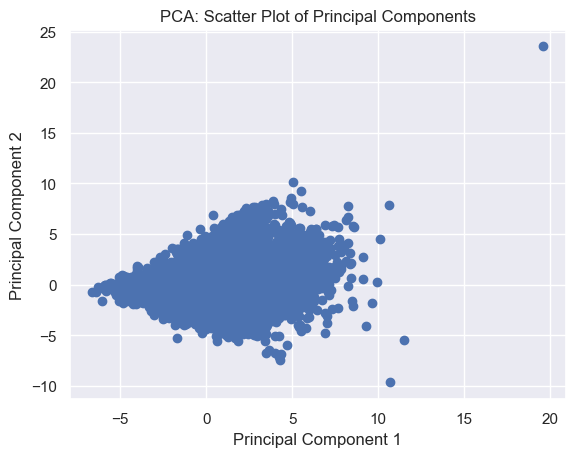

In [153]:
plt.scatter(X_pca[:, 0], X_pca[:, 1])
plt.title('PCA: Scatter Plot of Principal Components')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

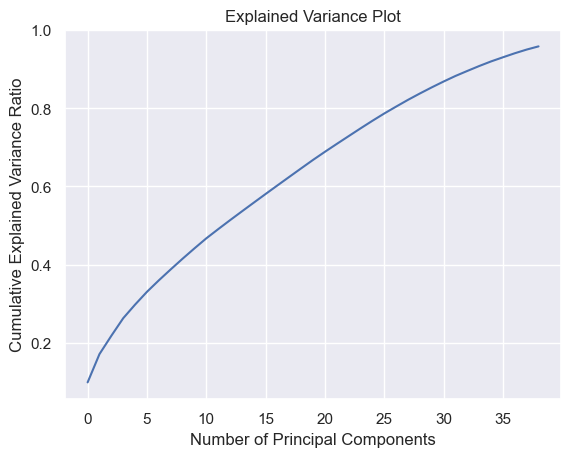

In [154]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Explained Variance Plot')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.show()

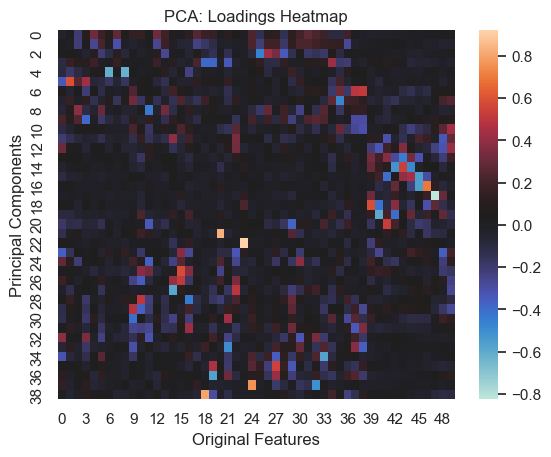

In [155]:
loadings = pca.components_
sns.heatmap(loadings,cmap="icefire")
plt.title('PCA: Loadings Heatmap')
plt.xlabel('Original Features')
plt.ylabel('Principal Components')
plt.show()

# Examine Categorical Variables

In [42]:
print("Property Tax Rate:", df['propertyTaxRate'].unique().tolist())
print("Home Type:", df['homeType'].unique().tolist())

Property Tax Rate: [1.98, 2.21, 2.01]
Home Type: [7, 6, 2, 8, 1, 9, 4, 5, 0, 3]


### latestPrice Information

In [43]:
print(df['latestPrice'].describe(percentiles=[.25, .50, .75, .95]))

count    1.517100e+04
mean     5.127677e+05
std      4.531853e+05
min      5.500000e+03
25%      3.090000e+05
50%      4.050000e+05
75%      5.750000e+05
95%      1.150000e+06
max      1.350000e+07
Name: latestPrice, dtype: float64


# Cities

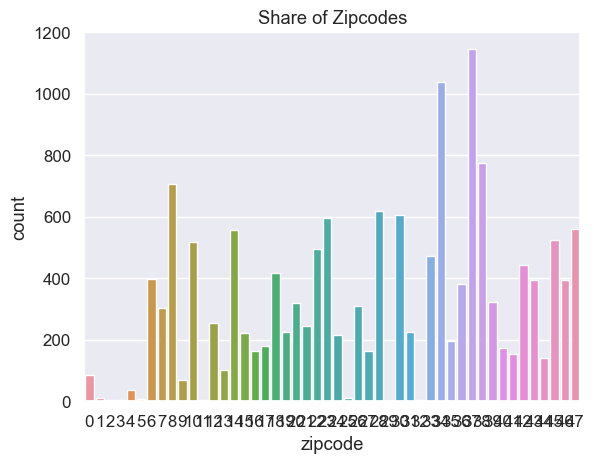

In [44]:
# using countplot to visualize the number of Airbnbs in each borough
#ax = sns.countplot(data=df, x = 'city', order=df['city'].value_counts().index)
ax = sns.countplot(data=df, x = 'zipcode')
ax.set_title('Share of Zipcodes')
plt.show()

# What is the average price of a home in Austin

In [23]:
house_sum = df.latestPrice.sum()
houses = len(df.index)
avg_price = house_sum / houses
print("The house house price is ${:.2f}".format(avg_price))

The house house price is $512767.74


## What is the average price of a single family home type in Austin

In [26]:
single_fam_df = df[df.homeType == 3]

total_sum = single_fam_df.latestPrice.sum()
houses = len(single_fam_df.index)
avg = total_sum / houses
print("The house house price is ${:.2f}".format(avg))

The house house price is $700725.00


# Violin plot density & distribution of prices based on House Type

# House types based on # of bedrooms?

In [27]:
room_availability_scatter = px.scatter(df, x="numOfBedrooms", color = "homeType", 
                                       title="Home types based on # Bedrooms", template="plotly_dark")
room_availability_scatter.show()

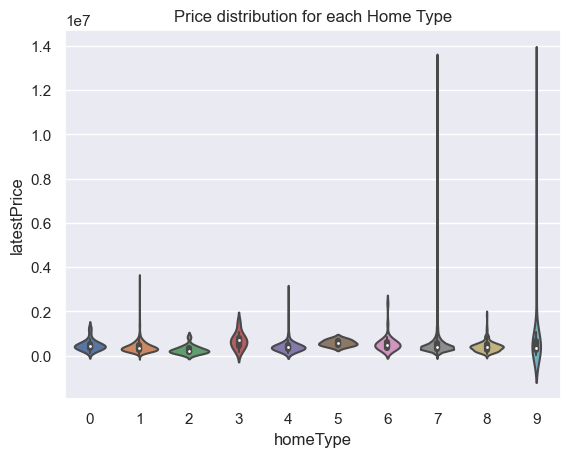

In [28]:
winsorized_df=df[df.latestPrice > 1]

viz_2=sns.violinplot(data=winsorized_df, x='homeType', y='latestPrice')
viz_2.set_title('Price distribution for each Home Type')
plt.show()

In [29]:
room_scatter = px.scatter(df, x="homeType", y="numOfBedrooms", color = "homeType", 
                                       title="Home types based on # Bedrooms", template="plotly_dark")
room_scatter.show()

# Plot 1 million dollar homes

In [30]:
million_df = df[df.latestPrice > 1000000]

map1 = px.scatter(million_df, x="latitude", y="longitude", color="homeType", template="plotly_dark", title="Million Dollar Homes in Austin", width=600,height=400)
map1.show()

# Plot houses with 3 rooms

In [31]:
three_rooms_df = df[df.numOfBedrooms >= 3]
three_rooms_df = three_rooms_df[three_rooms_df.numOfBedrooms < 4]

map2 = px.scatter(three_rooms_df, x="latitude", y="longitude", color="homeType", template="plotly_dark", title="Houses w/ 3 rooms", width=600,height=400)
map2.show()